In [3]:
import matplotlib.pyplot as plt
from spider import SPIDER
op = SPIDER()
import anndata
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np

# use cpus only
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
TF_ENABLE_ONEDNN_OPTS = 0

2023-09-22 14:36:02.125143: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-22 14:36:02.128825: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-22 14:36:02.209148: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-22 14:36:02.210401: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-22 14:36:03.774042: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [4]:
ds = 'mouse_embryo'
sample_name = 'embryo1_2'
out_f = f'../input_datasets/{ds}/{sample_name}/'
adata = anndata.read_h5ad(f'{out_f}/adata.h5ad')
out_f = f'../datasets/{ds}/{sample_name}/'


running results

In [ ]:
# R_path = 'your R path'
# no_spatalk = False
# if len(adata) > 10000:
#     no_spatalk=True
# idata = op.prep(adata, out_f, R_path, cluster_key=adata.uns['cluster_key'], is_human=adata.uns['is_human'], coord_type=adata.uns['coord_type'], no_spatalk=no_spatalk)
# idata, meta_idata = op.find_svi(idata, out_f, R_path, alpha=0.3)
# idata.write_h5ad(f'{out_f}/idata.h5ad')

read results

In [5]:
idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

metrics

Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC' 'moranI']
47/47 SVIs identified (threshold=0.01).
evaluating with ['moranI' 'gearyC' 'SOMDE' 'nnSVG']


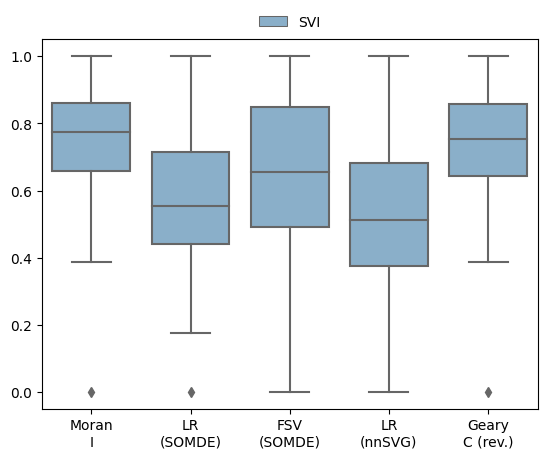

In [6]:
svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
op.svi.eva_SVI(idata, svi_df_strict)

100%|██████████| 1000/1000 [01:02<00:00, 16.05/s]


Mouse KEGG_2019_Mouse
Using mouse LR pair dataset.
50
0.5179533452419275 0.34361495559329286 0.2813093088682017


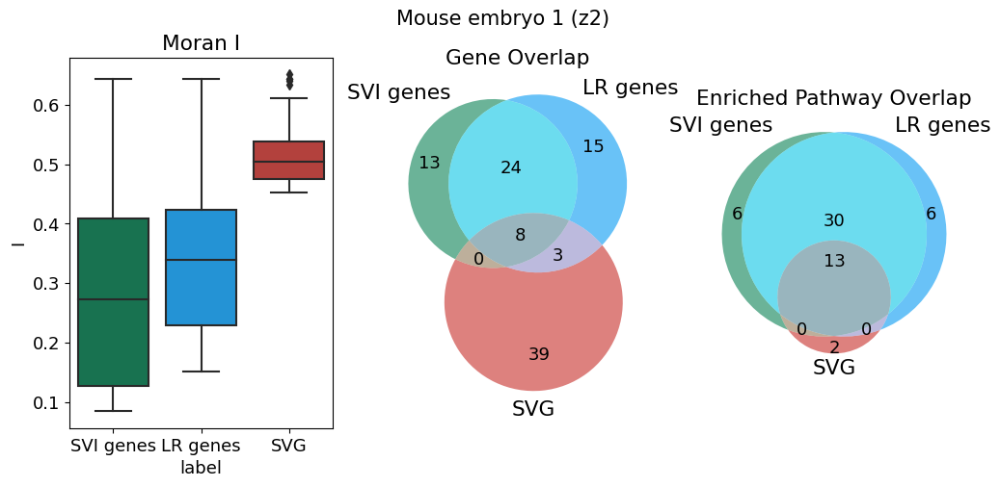

In [12]:
sq.gr.spatial_neighbors(adata, key_added='spatial')
sq.gr.spatial_autocorr(
    adata,
    genes=adata.var_names,
    mode="moran",
    n_perms=1000,
    n_jobs=10,
)
plt.rcParams['font.size'] = 13
merged_df,lri_pw_list,gene_lr_list,gene_pw_list = op.vis.svg_svi_relation(adata, idata, title='Mouse embryo 1 (z2)', is_human=adata.uns['is_human'], top=50)
plt.savefig(f'../figures/{ds}_{sample_name}_relation.png', dpi=600,bbox_inches='tight')

In [ ]:
import gseapy
membership=pd.get_dummies(merged_df.set_index('Term')['group']).groupby('Term').sum().astype(str).agg('-'.join, axis=1)
merged_df['group name'] = membership.loc[merged_df.Term].to_numpy()
rename_dict = {
    '1-0-0': 'LR', '1-0-1':'SVI&LR', '0-0-1':'SVI', '1-1-1':'All', '0-1-0':'SVG', '0-1-1':'SVI&SVG'
}
merged_df['group name'] = merged_df['group name'] .astype('category').cat.rename_categories(rename_dict).to_numpy()
op.vis.enrichment(merged_df,x_key='group name', cutoff=0.05, top_term=20,size=15)
        

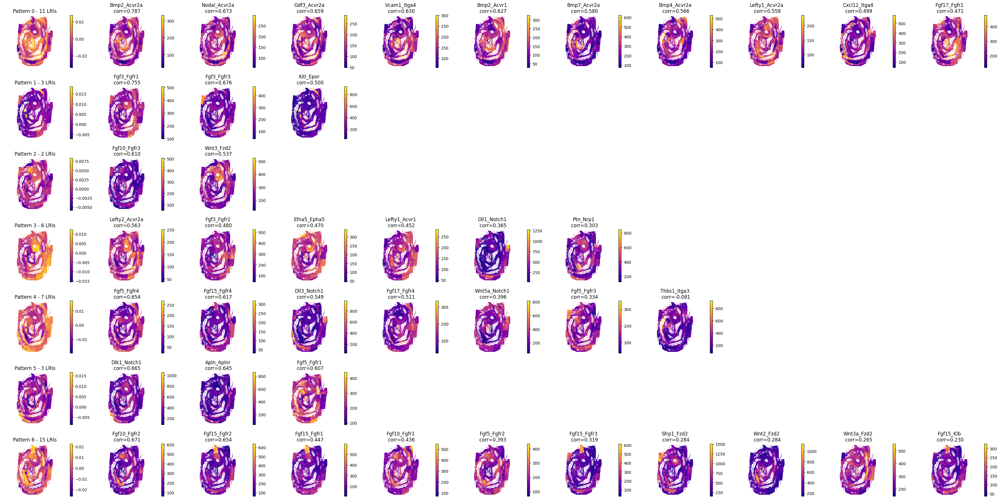

In [ ]:
op.vis.pattern_LRI(idata,show_SVI=10, spot_size=1)
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_patterns.png', dpi=100,bbox_inches='tight')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1_no vs. 1_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.233e-04 U_stat=0.000e+00
0_no vs. 0_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.107e-06 U_stat=1.600e+01
2_no vs. 2_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.850e-03 U_stat=0.000e+00
3_no vs. 3_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.450e-07 U_stat=2.000e+00
4_no vs. 4_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.593e-04 U_stat=2.500e+01
5_no vs. 5_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.233e-04 U_stat=0.000e+00
6_no vs. 6_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction

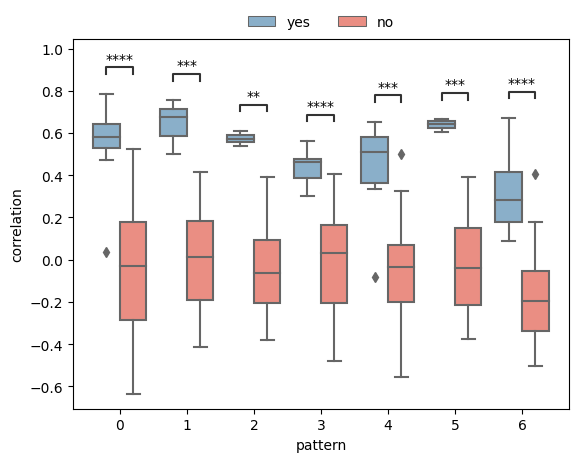

In [ ]:
op.svi.eva_pattern(idata)
plt.savefig(f'../figures/{ds}_{sample_name}_pattern_metric.png', dpi=100,bbox_inches='tight')


In [8]:
idata = idata[:, idata.var['is_svi']==1]

In [9]:
adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])
adata_lri.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']
adata_pattern.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


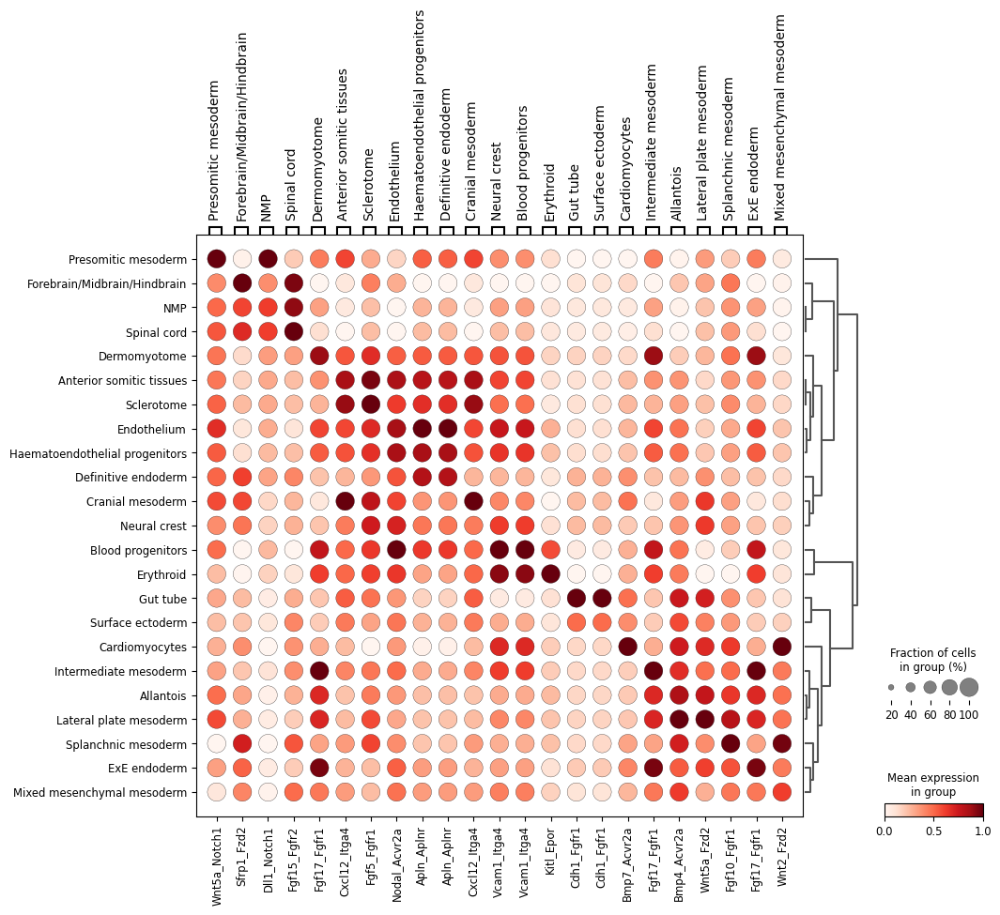

In [10]:
with plt.rc_context():
    sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', n_genes=1, show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI.png', bbox_inches="tight")

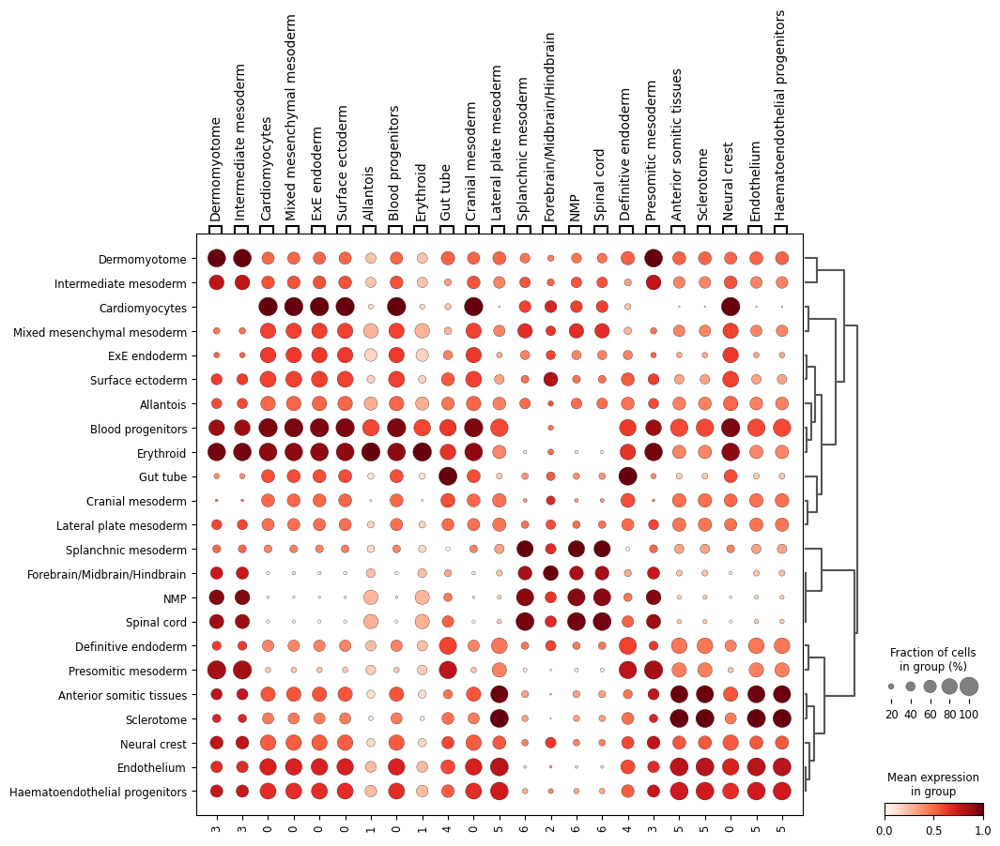

In [11]:
with plt.rc_context(): 
    sc.pl.rank_genes_groups_dotplot(adata_pattern, standard_scale='var', n_genes=1, show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_pattern.png', bbox_inches="tight")


In [28]:
from scipy import stats
pds = []
for i in adata_lri.var_names:
    pds.append(pd.get_dummies(adata.obs[adata.uns['cluster_key']]).corrwith(adata_lri.to_df()[i].astype('float'), method=stats.pointbiserialr)[:1])
pds_df = pd.concat(pds)
pds_df.index = adata_lri.var_names

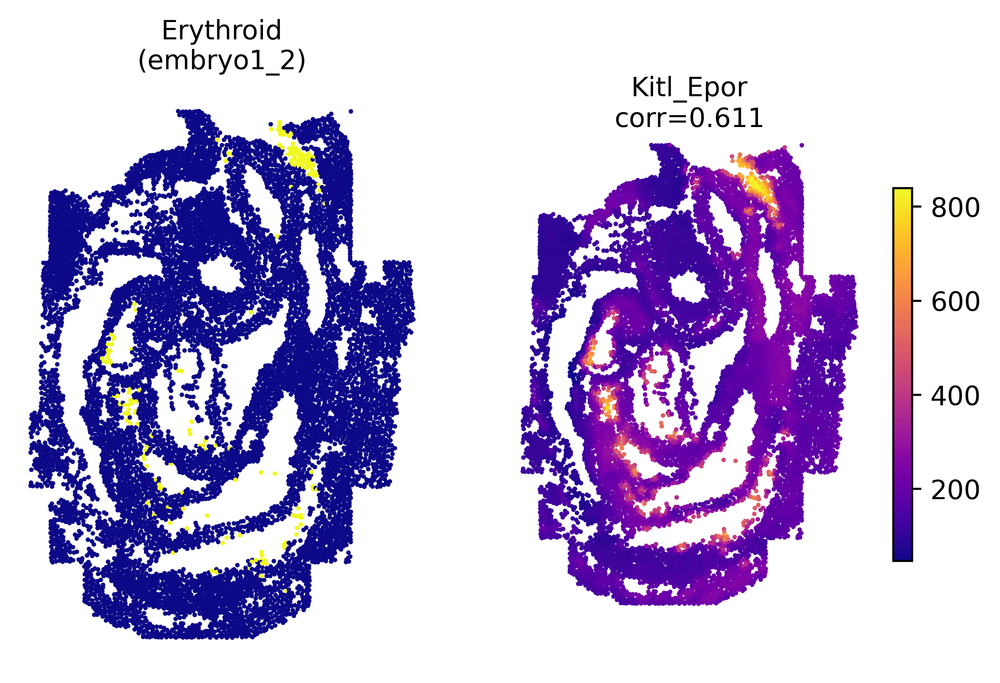

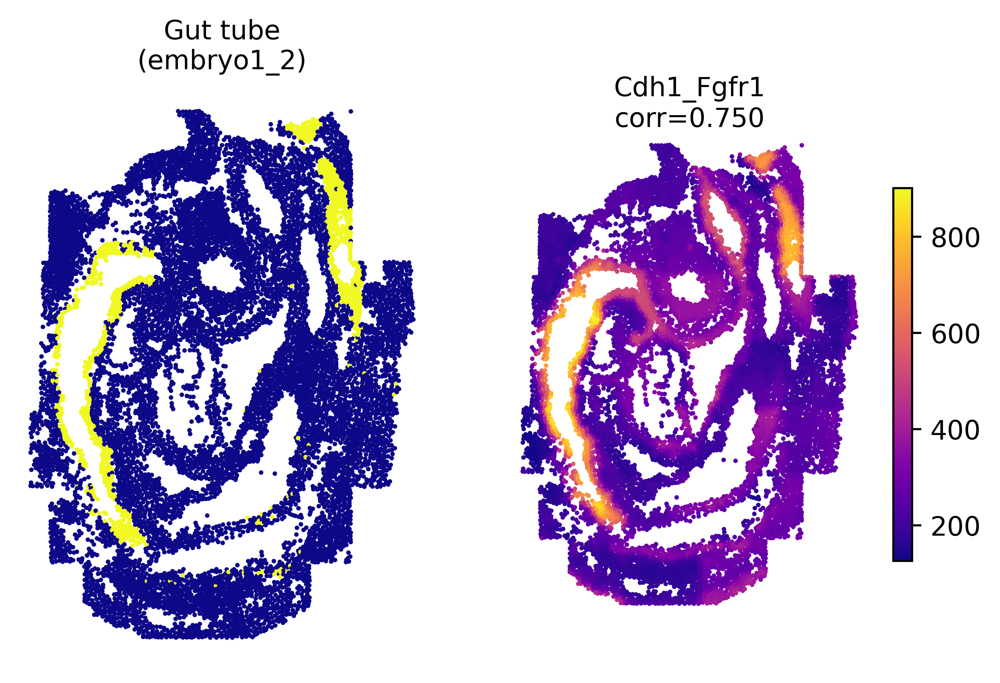

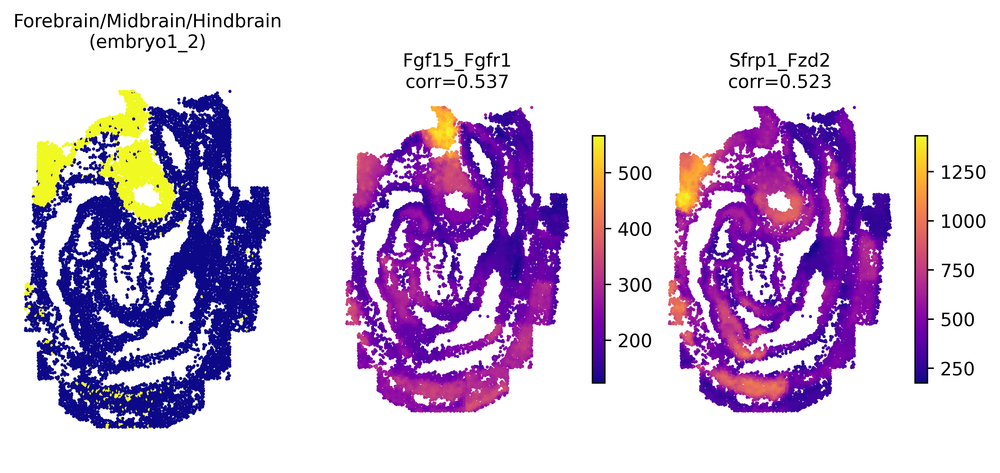

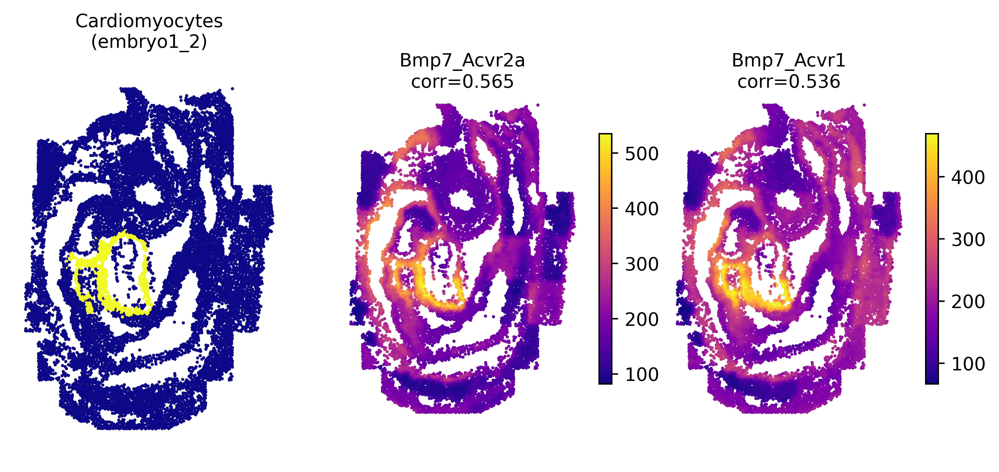

In [29]:

useful_df = []

df_plot = pd.concat([idata.uns['cell_meta'][['x_global_affine', 'y_global_affine']], pd.get_dummies(idata.uns['cell_meta']['celltype_mapped_refined'])], axis=1)
for i in adata.obs['celltype_mapped_refined'].unique():
    df_sub = pds_df[pds_df[i]>0.5][i].sort_values(ascending=False)
    if len(df_sub) > 0:
        useful_df.append(df_sub)
        markers = df_sub.index.to_numpy()
        corrs = df_sub.values
        cluster_name = df_sub.name
        plt.figure(figsize=(3*(len(markers)+1), 4))
        base = 1
        plt.subplot(1, len(markers)+1, base)
        plt.scatter(df_plot['x_global_affine'],df_plot['y_global_affine'], c=df_plot[cluster_name], s=0.5, cmap='plasma')
        plt.axis('equal')
        plt.axis('off')
        if not cluster_name.__contains__('brain'):
            plt.title(f'{cluster_name}\n({sample_name})', y=1, fontdict={'fontsize': 10})
        else:
            plt.title(f'{cluster_name}\n({sample_name})', y=1, fontdict={'fontsize': 10})
            
        base += 1

        marker_score = adata_lri.to_df()[markers]
        marker_score = pd.concat([adata.obs[['x_global_affine', 'y_global_affine']], marker_score], axis=1)
        for i in range(min(len(markers), 2)):
            plt.subplot(1, len(markers)+1, base)
            im=plt.scatter(marker_score['x_global_affine'],marker_score['y_global_affine'], c=marker_score[markers[i]], s=0.5, cmap='plasma')
            plt.colorbar(im,fraction=0.046, pad=0.05)
            plt.axis('equal')
            plt.axis('off')
            plt.title(f'{markers[i]}\ncorr={"%.3f" % corrs[i]}', y=0.9, fontdict={'fontsize': 10})
            base += 1

In [14]:
sc.pp.neighbors(adata_lri, n_neighbors=10, n_pcs=40, use_rep='X')
sc.tl.umap(adata_lri)
sc.tl.leiden(adata_lri,resolution=0.1, seed=0)

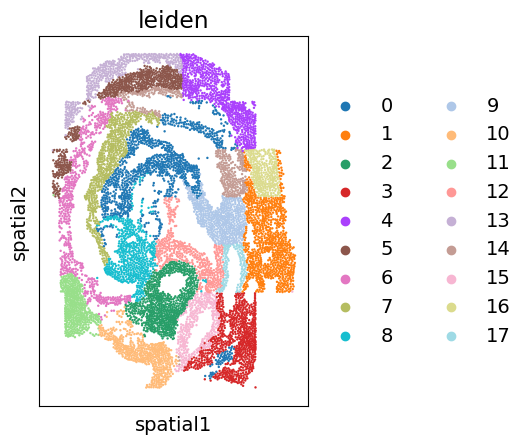

In [15]:
main_clusters = adata_lri.obs['leiden'].value_counts().index[adata_lri.obs['leiden'].value_counts() > 100].to_numpy()
adata_lri_subset = adata_lri[adata_lri.obs['leiden'].isin(main_clusters)]
sc.pl.spatial(adata_lri_subset, color=['leiden'], spot_size=0.05)

(-2.8028513337169976,
 2.7737768053548275,
 -3.8405847760916862,
 3.839975010998306)

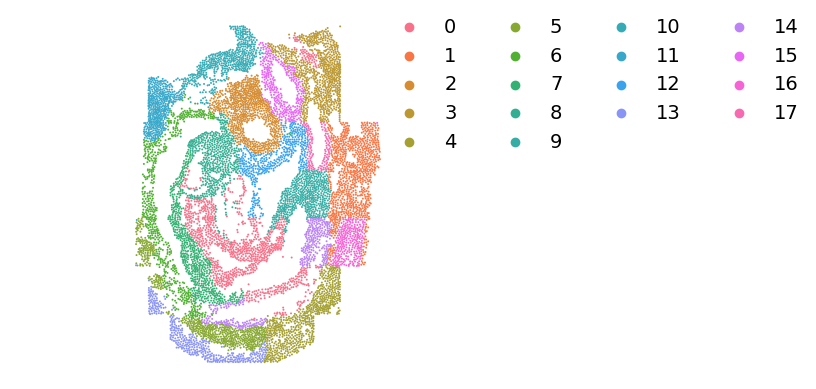

In [16]:
to_plot = pd.DataFrame(adata_lri_subset.obs['leiden'])
to_plot[['x','y']] = adata_lri_subset.obsm['spatial']
import seaborn as sns
custom_palette = sns.color_palette("husl",to_plot.leiden.nunique())
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden', palette=custom_palette, s=2, linewidth=0, legend=True)
# move legend to right
plt.legend(bbox_to_anchor=(0.75, 1), loc=2, borderaxespad=0., ncols=4, frameon=False)
plt.axis('equal')
plt.axis('off')

(-2.8028513337169976,
 2.7737768053548275,
 -3.8405847760916862,
 3.839975010998306)

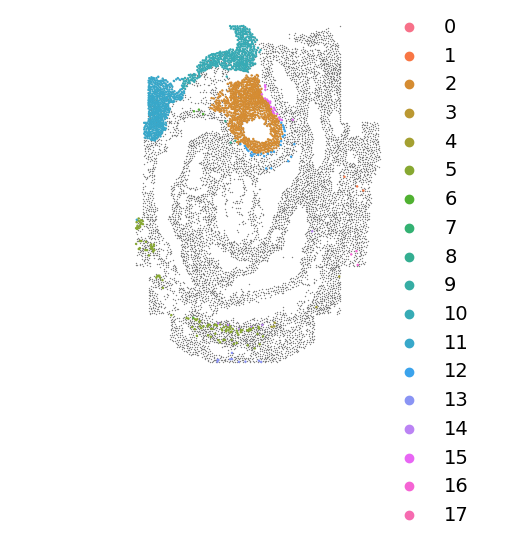

In [17]:
to_plot['leiden_brain'] = to_plot['leiden']
to_plot.loc[adata_lri_subset.obs[adata_lri_subset.obs['celltype_mapped_refined'] != 'Forebrain/Midbrain/Hindbrain'].index, 'leiden_brain'] = np.nan
sns.scatterplot(data=to_plot, x='x', y='y', s=1, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_brain', s=3, linewidth=0, legend=True)
# move legend to right
plt.legend(bbox_to_anchor=(0.75, 1), loc=2, borderaxespad=0., ncols=1, frameon=False)
plt.axis('equal')
plt.axis('off')

(-2.8028513337169976,
 2.7737768053548275,
 -3.8405847760916862,
 3.839975010998306)

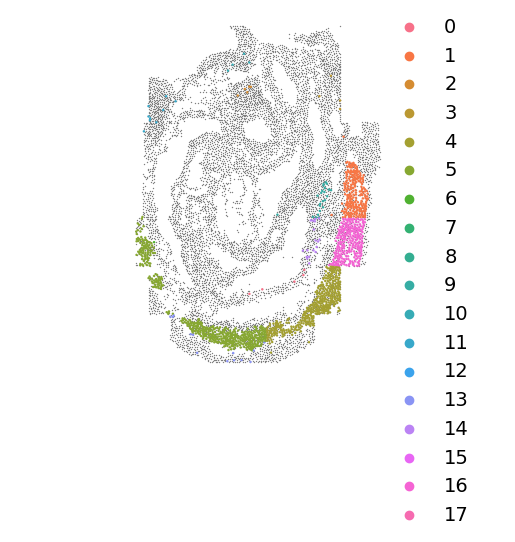

In [18]:
to_plot['leiden_spinal'] = to_plot['leiden']
to_plot.loc[adata_lri_subset.obs[adata_lri_subset.obs['celltype_mapped_refined'] != 'Spinal cord'].index, 'leiden_spinal'] = np.nan
sns.scatterplot(data=to_plot, x='x', y='y', s=1, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_spinal', s=3, linewidth=0, legend=True)
# move legend to right
plt.legend(bbox_to_anchor=(0.75, 1), loc=2, borderaxespad=0., ncols=1, frameon=False)
plt.axis('equal')
plt.axis('off')

In [106]:
to_plot['leiden_spinal'].value_counts()

5     481
4     393
16    256
1     227
9      23
14     18
13     13
11      9
0       5
2       5
10      4
3       4
6       1
8       0
7       0
12      0
15      0
17      0
Name: leiden_spinal, dtype: int64

In [19]:
adata_lri_brain = adata_lri[adata_lri.obs['leiden'].isin(['2', '11', '10'])]

In [20]:
sc.tl.rank_genes_groups(adata_lri_brain, groupby='leiden')

{'mainplot_ax': <AxesSubplot: >,
 'gene_group_ax': <AxesSubplot: >,
 'size_legend_ax': <AxesSubplot: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <AxesSubplot: title={'center': 'Mean expression\nin group'}>}

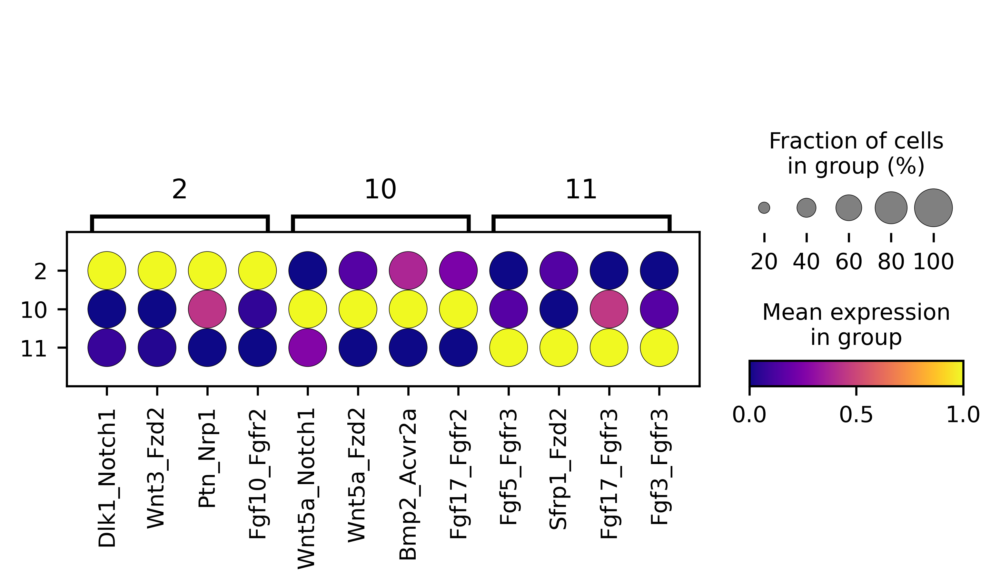

In [21]:
sc.set_figure_params(dpi=300, fontsize=10)
sc.pl.rank_genes_groups_dotplot(adata_lri_brain, standard_scale='var', n_genes=4, show=False, dendrogram=False, color_map='plasma')

In [22]:
adata_lri_brain.uns['rank_genes_groups']['names']['2'][:10]

array(['Dlk1_Notch1', 'Wnt3_Fzd2', 'Ptn_Nrp1', 'Fgf10_Fgfr2',
       'Fgf10_Fgfr1', 'Lefty1_Acvr1', 'Fgf5_Fgfr2', 'Cdh1_Fgfr1',
       'Lefty2_Acvr2a', 'Bmp4_Acvr2a'], dtype=object)

In [23]:
adata_lri_brain.uns['rank_genes_groups']['logfoldchanges']['2'][:10]

array([293.88864 , 194.24709 , 211.3327  , 219.74806 , 166.87656 ,
        59.894512, 102.36286 , 118.792786,  70.252014, 109.95995 ],
      dtype=float32)

In [24]:
arr = []
for cluster_i in ['2', '11', '10']:
    df_sub = adata_lri_brain.uns['rank_genes_groups']['names']['2'][:20]
    for j in df_sub:
        arr.append([cluster_i, j])
celltype_lris = pd.DataFrame(arr, columns=['cluster', 'g'])
celltype_lris['membership']=1
custom, background = op.er.pathway_prep(idata, is_human=False)
merged_df, arr = op.er.enrichment(custom, background, celltype_lris, groupby='cluster',)

Using mouse LR pair dataset.


In [25]:
merged_df.query('group=="11"')

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes,group,ordered_group
0,gs_ind_0,Basal cell carcinoma,2/4,0.458824,0.678261,1.570048,Wnt3_Fzd2;Wnt3a_Fzd2,11,11
1,gs_ind_0,Breast cancer,4/11,0.633499,0.742723,1.050343,Fgf10_Fgfr1;Wnt3_Fzd2;Wnt3a_Fzd2;Fgf5_Fgfr1,11,11
2,gs_ind_0,Choline metabolism in cancer,1/1,0.361111,0.678261,2.840000,Pdgfa_Pdgfra,11,11
3,gs_ind_0,Cushing syndrome,2/4,0.458824,0.678261,1.570048,Wnt3_Fzd2;Wnt3a_Fzd2,11,11
4,gs_ind_0,Cytokine-cytokine receptor interaction,2/6,0.723593,0.751961,1.020067,Nodal_Acvr2a;Bmp4_Acvr2a,11,11
5,gs_ind_0,ECM-receptor interaction,1/1,0.361111,0.678261,2.840000,Thbs1_Itga3,11,11
6,gs_ind_0,EGFR tyrosine kinase inhibitor resistance,1/1,0.361111,0.678261,2.840000,Pdgfa_Pdgfra,11,11
7,gs_ind_0,Fluid shear stress and atherosclerosis,1/1,0.361111,0.678261,2.840000,Bmp4_Acvr2a,11,11
8,gs_ind_0,Focal adhesion,2/2,0.123810,0.678261,3.000000,Pdgfa_Pdgfra;Thbs1_Itga3,11,11
9,gs_ind_0,Gap junction,1/1,0.361111,0.678261,2.840000,Pdgfa_Pdgfra,11,11
